**Object detection using single detector SSD**

**SSD**

In [15]:
!pip install torch torchvision


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 75.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 37.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 70.0 MB/s eta 0:00:00


In [16]:
import torch
import torchvision
from torchvision import transforms

# Load a pre-trained SSD model with a specified backbone (like VGG16)
model = torchvision.models.detection.ssd300_vgg16(pretrained=True)
model.eval()  # Set the model to evaluation mode


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SSD300_VGG16_Weights.COCO_V1`. You can also use `weights=SSD300_VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/ssd300_vgg16_coco-b556d3b4.pth" to /root/.cache/torch/hub/checkpoints/ssd300_vgg16_coco-b556d3b4.pth
100%|██████████| 136M/136M [00:02<00:00, 60.4MB/s]


SSD(
  (backbone): SSDFeatureExtractorVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=

In [17]:
import cv2
from PIL import Image

# Load the image using OpenCV and convert it to RGB
image_path = "/content/carr.jpg"  # Change to your image path
image = cv2.imread(image_path)  # Read the image
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for processing

# Define the necessary transformations for SSD
transform = transforms.Compose([
    transforms.ToPILImage(),  # Convert to PIL Image
    transforms.Resize((300, 300)),  # Resize to SSD's expected input size
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),  # Normalize
])

# Apply the transformations
image_tensor = transform(image_rgb).unsqueeze(0)  # Add a batch dimension


In [18]:
# Perform object detection
with torch.no_grad():
    detections = model(image_tensor)  # Perform detection

# Get the detected objects from the output
boxes = detections[0]["boxes"]  # Bounding box coordinates
labels = detections[0]["labels"]  # Class labels
scores = detections[0]["scores"]  # Confidence scores


In [26]:
# Extract bounding boxes from the detection results
boxes = detections[0]["boxes"]  # List of bounding box coordinates
scores = detections[0]["scores"]  # Confidence scores for each box
labels = detections[0]["labels"]  # Class labels

# Ensure we're using the correct variable names
image_with_boxes = image_rgb.copy()  # Create a copy of the original image for drawing bounding boxes

# Set a confidence threshold
threshold = 0.5

# Loop through the detected boxes
for box, score, label in zip(boxes, scores, labels):
    if score >= threshold:  # Apply the confidence threshold
        # Ensure box coordinates are integers
        x1, y1, x2, y2 = map(int, box.tolist())  # Convert to integers
        # Ensure coordinates are ordered correctly
        x1, x2 = sorted([x1, x2])
        y1, y2 = sorted([y1, y2])

        # Draw the bounding box
        cv2.rectangle(image_with_boxes, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Get the class name from the label index (COCO classes, for example)
        coco_classes = ["__background__", "person", "bicycle", "car", "motorcycle", "airplane", "bus", "train", "truck", "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", ]


In [28]:
# Extract and ensure coordinates are integers
x1, y1, x2, y2 = box.int().tolist()  # Get integer coordinates and convert to list


In [29]:
# Ensure that the bounding box coordinates are in the correct order
x1, x2 = sorted([x1, x2])  # Ensure x1 < x2
y1, y2 = sorted([y1, y2])  # Ensure y1 < y2


In [30]:
# Convert coordinates to integers
x1 = int(x1)
y1 = int(y1)
x2 = int(x2)
y2 = int(y2)


In [31]:
# COCO dataset class names
coco_classes = [
    "__background__", "person", "bicycle", "car", "motorcycle", "airplane", "bus",
    "train", "truck", "boat", "traffic light", "fire hydrant", "stop sign", "parking meter",

]


In [32]:
# Loop through the detected objects and draw bounding boxes
for box, label, score in zip(boxes, labels, scores):
    if score >= 0.5:  # Only keep detections with a confidence score of 0.5 or higher
        # Get bounding box coordinates and ensure they're integers
        x1, y1, x2, y2 = map(int, box.cpu().tolist())  # Convert tensor to list and then to integers

        # Ensure bounding box coordinates are in the correct order
        x1, x2 = sorted([x1, x2])  # Ensure x1 < x2
        y1, y2 = sorted([y1, y2])  # Ensure y1 < y2

        # Draw the bounding box
        cv2.rectangle(image_with_boxes, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Get the class name from the label index
        class_name = "Unknown"  # Default fallback class name
        if 0 <= label < len(coco_classes):  # Ensure label index is valid
            class_name = coco_classes[int(label)]

        # Draw the label and confidence score
        text = f"{class_name}: {float(score):.2f}"  # Ensure confidence is a float
        cv2.putText(image_with_boxes, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)


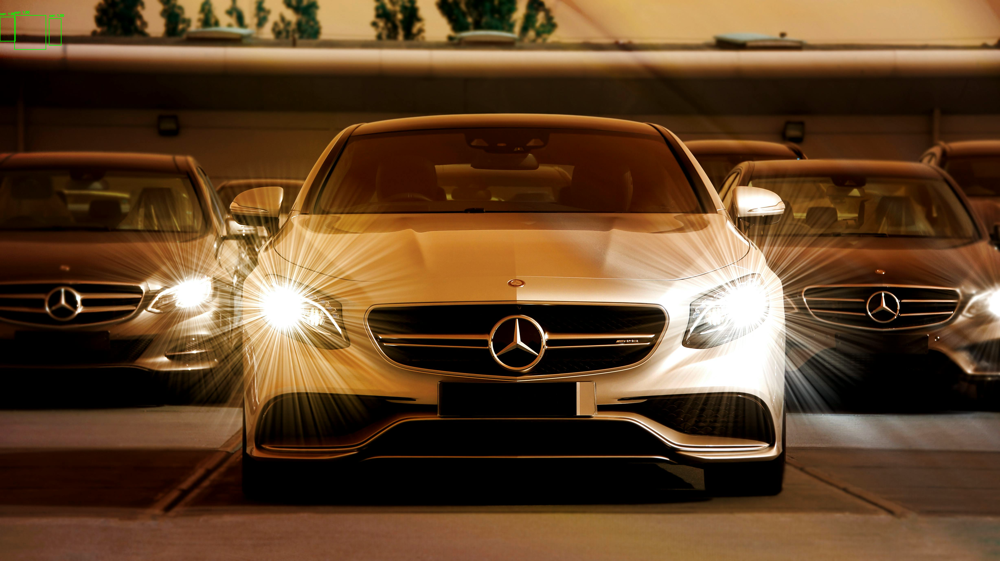

In [33]:
# Display the image with bounding boxes
from google.colab.patches import cv2_imshow
cv2_imshow(image_with_boxes)

In [34]:
import cv2
import numpy as np
import torchvision.transforms as transforms
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import torch

# Ensure consistent image size throughout
image_path = "/content/carr.jpg"  # Replace with your image path
image = cv2.imread(image_path)  # Read the image using OpenCV
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for PIL and PyTorch

# Define the necessary transformations for SSD
transform = transforms.Compose([
    transforms.ToPILImage(),  # Convert OpenCV image to PIL
    transforms.Resize((300, 300)),  # Resize to match SSD input size
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),  # Normalize for SSD
])

# Convert to tensor and add batch dimension
image_tensor = transform(image_rgb).unsqueeze(0)

# Load a pre-trained SSD model
model = torchvision.models.detection.ssd300_vgg16(pretrained=True)
model.eval()

# Perform object detection
with torch.no_grad():
    detections = model(image_tensor)

# Draw bounding boxes on a copy of the original image
image_with_boxes = image_rgb.copy()  # Ensure we're using the original image


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SSD300_VGG16_Weights.COCO_V1`. You can also use `weights=SSD300_VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [38]:
boxes = detections[0]["boxes"]  # Bounding box coordinates
scores = detections[0]["scores"]  # Confidence scores
labels = detections[0]["labels"]  # Class labels

# Define a threshold to filter low-confidence detections
threshold = 2.5

# Loop through the detections and draw bounding boxes on the image
for box, score, label in zip(boxes, scores, labels):
    if score >= threshold:  # Apply the confidence threshold
        # Convert bounding box coordinates to integers
        x1, y1, x2, y2 = map(int, box.tolist())

        # Draw the bounding box and ensure coordinates are in order
        x1, x2 = sorted([x1, x2])
        y1, y2 = sorted([y1, y2])

        # Draw the bounding box and label
        cv2.rectangle(image_with_boxes, (x1, y1), (x2, y2), (0, 255, 0), 2)
        class_name = "Object"  # Default class name
        text = f"{class_name}: {score:.2f}"
        cv2.putText(image_with_boxes, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 2.5, (0, 255, 0), 2)


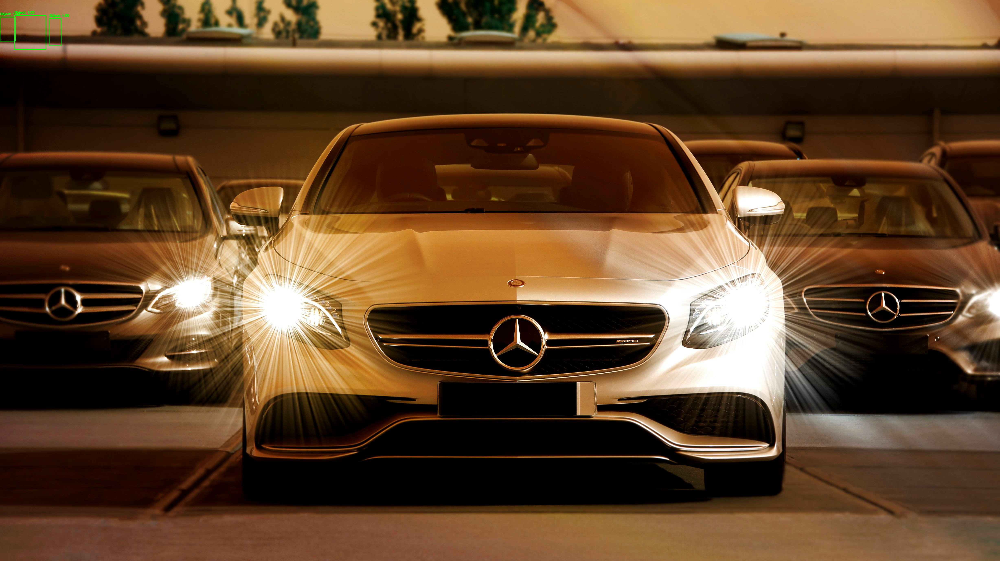

In [36]:
from google.colab.patches import cv2_imshow  # For displaying images in Google Colab
cv2_imshow(image_with_boxes)  # Show the image with bounding boxes
